In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np

In [2]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [3]:
class VGGFeatures(nn.Module):
    """
    Extract features from VGG19 up to a specific layer index.
    conv4_1 in PyTorch VGG19 is at index 21.
    """
    def __init__(self, selected_layer=21):
        super().__init__()
        self.vgg = models.vgg19(pretrained=True).features.to(device).eval()
        self.selected_layer = selected_layer

    def forward(self, x):
        for i, layer in enumerate(self.vgg):
            x = layer(x)
            if i == self.selected_layer:
                return x

# Choose conv4_1
feature_extractor = VGGFeatures(selected_layer=21)

c:\Users\lenovo\anaconda3\envs\torchenv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lenovo\anaconda3\envs\torchenv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Feel free to use smaller/larger
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

def denormalize(tensor):
    """
    De-normalize a tensor for visualization.
    """
    tensor = tensor.clone().detach().cpu()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return torch.clamp(tensor, 0, 1)

def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image).unsqueeze(0)
    return image.to(device)

# Replace with your style image path
style_image = load_image(r"Images\wallhaven-p9532p.jpg")

In [6]:
def gram_matrix(features):
    """
    features: (B=1, C, H, W)
    Returns the Gram matrix of size (C, C).
    """
    B, C, H, W = features.size()
    # Reshape features to (C, H*W)
    features = features.view(C, H * W)
    # Compute Gram matrix
    G = torch.mm(features, features.t())  # (C, C)
    return G


In [7]:
with torch.no_grad():
    style_features = feature_extractor(style_image)  # shape: [1, C, H, W]
    style_gram = gram_matrix(style_features)

In [8]:
# Initialize a noise image
noise_image = torch.randn_like(style_image, requires_grad=True, device=device)

In [9]:
def style_loss_func(gen_feats, style_gram):
    B, C, H, W = gen_feats.size()
    G_gen = gram_matrix(gen_feats)
    # Coeff = 1 / (4 * (C^2) * (H*W)^2)
    #   => N = C, M = H*W
    N = C
    M = H * W
    coeff = 1.0 / (4.0 * (N**2) * (M**2))
    # sum of squared differences
    diff = (G_gen - style_gram)**2
    return coeff * torch.sum(diff)

In [13]:
optimizer = optim.LBFGS([noise_image], lr=1.0, max_iter=50, history_size=10)

num_iterations = 200
result_images = []

print("Starting LBFGS optimization...")

for i in range(num_iterations):
    def closure():
        optimizer.zero_grad()
        gen_feats = feature_extractor(noise_image)
        loss = style_loss_func(gen_feats, style_gram)
        loss.backward()
        return loss

    loss = optimizer.step(closure)

    # Store frames every 10 iterations (to reduce size)
    if i % 10 == 0 or i == num_iterations - 1:
        vis_img = denormalize(noise_image.squeeze(0))
        result_images.append(np.transpose(vis_img.numpy(), (1, 2, 0)))

    if (i + 1) % 20 == 0:
        print(f"Iteration {i+1}/{num_iterations}, Loss: {loss.item():.4f}")

print("LBFGS optimization finished.")

Starting LBFGS optimization...
Iteration 20/200, Loss: 0.5888
Iteration 40/200, Loss: 0.4546
Iteration 60/200, Loss: 0.3999
Iteration 80/200, Loss: 0.3679
Iteration 100/200, Loss: 0.3490
Iteration 120/200, Loss: 0.3356
Iteration 140/200, Loss: 0.3246
Iteration 160/200, Loss: 0.3157
Iteration 180/200, Loss: 0.3088
Iteration 200/200, Loss: 0.3029
LBFGS optimization finished.


In [16]:
import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 50  # Increase limit if needed (MB)

fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(result_images[0])
ax.axis('off')
ax.set_title("Noise -> Style Reconstruction Progress")

def update(frame):
    im.set_array(result_images[frame])
    ax.set_title(f"Iteration {frame*10}")
    return [im]

from matplotlib.animation import FuncAnimation
anim = FuncAnimation(fig, update, frames=len(result_images), interval=200, blit=True)
plt.close()

from IPython.display import HTML
HTML(anim.to_jshtml())

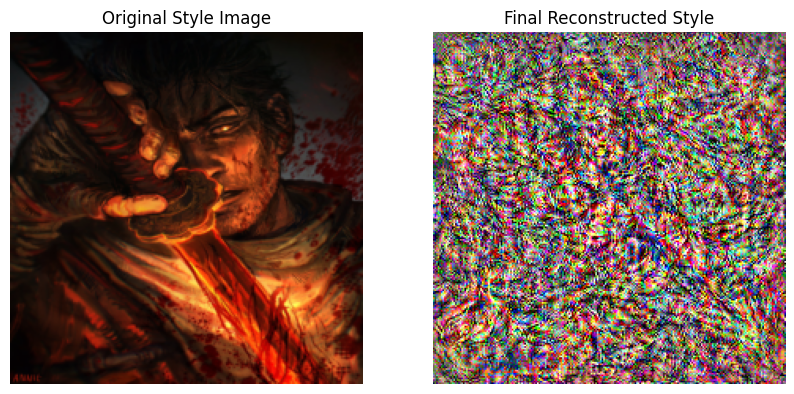

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Style image
style_vis = denormalize(style_image.squeeze(0))
axs[0].imshow(np.transpose(style_vis.numpy(), (1, 2, 0)))
axs[0].set_title("Original Style Image")
axs[0].axis('off')

# Final
final_vis = result_images[-1]
axs[1].imshow(final_vis)
axs[1].set_title("Final Reconstructed Style")
axs[1].axis('off')


plt.show()

In [ ]:
# %% [markdown]
# # Style Reconstruction Using Gram Matrix (Single Layer)
#
# This notebook shows how to reconstruct the "style" from a single style image
# by matching Gram matrices of a chosen layer (e.g., conv4_1 in VGG19).
#
# Steps:
# 1. Load a pretrained VGG19 and pick a layer for style (conv4_1 at index 21).
# 2. Load the style image and create a noise image.
# 3. Compute the Gram matrix for the style image's features at that layer.
# 4. Define the style loss using the Gram matrix formula:
#    E_l = (1 / (4*N^2 * M^2)) * sum((G_l^gen - G_l^style)^2)
# 5. Optimize the noise image to match the style image's Gram matrix at that layer.
# 6. Visualize the result.




# %% [markdown]
# ## 1. Feature Extractor for a Single Layer
#
# We create a small module that stops at a specified layer (e.g., conv4_1).

# %% [code]


# %% [markdown]
# ## 2. Preprocessing and Loading the Style Image
#
# We define a standard ImageNet‐based transform and a denormalization function for display.

# %% [code]


# %% [markdown]
# ## 3. Gram Matrix Function
#
# The Gram matrix for a feature map `F` with shape `[1, C, H, W]` is computed as:
#
# \[
# G = F \times F^T
# \]
#
# after reshaping `F` into `[C, H*W]`.

# %% [code]

# %% [markdown]
# ## 4. Compute the Target Gram Matrix
#
# We pass the style image through the VGG feature extractor (up to conv4_1),
# then compute the Gram matrix. This will be our **target** for style reconstruction.

# %% [code]


# %% [markdown]
# ## 5. Create a Noise Image and Define the Style Loss
#
# We create a random noise image of the same shape as the style image. Our goal is
# to optimize this noise so that its Gram matrix matches the style Gram matrix.

# %% [code]


# The style loss formula from your image:
# E_l = (1 / (4*N^2 * M^2)) * sum((G^gen - G^style)^2)



# %% [markdown]
# ## 6. Optimize Using LBFGS
#
# We use LBFGS to minimize the style loss. We store intermediate images for optional animation.

# %% [code]


# %% [markdown]
# ## 7. Animation (Optional)
#
# If you want to visualize the progression, we can use `matplotlib.animation.FuncAnimation`.
# Be mindful of the potential size of the embedded animation.

# %% [code]


# %% [markdown]
# ## 8. Show Final Result
#
# Compare the final noise image (now stylized) with the original style image.

# %% [code]

